In [1]:
import import_ipynb
%run Crime_Data.ipynb

import matplotlib.pyplot as plt

[
    {
        "area": "03",
        "area_name": "Southwest",
        "crm_cd": "624",
        "crm_cd_1": "624",
        "crm_cd_desc": "BATTERY - SIMPLE ASSAULT",
        "date_occ": "2020-01-08T00:00:00.000",
        "date_rptd": "2020-01-08T00:00:00.000",
        "dr_no": "010304468",
        "lat": "34.0141",
        "location": "1100 W  39TH                         PL",
        "lon": "-118.2978",
        "mocodes": "0444 0913",
        "part_1_2": "2",
        "premis_cd": "501",
        "premis_desc": "SINGLE FAMILY DWELLING",
        "rpt_dist_no": "0377",
        "status": "AO",
        "status_desc": "Adult Other",
        "time_occ": "2230",
        "vict_age": "36",
        "vict_descent": "B",
        "vict_sex": "F",
        "weapon_desc": "STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",
        "weapon_used_cd": "400"
    },
    {
        "area": "01",
        "area_name": "Central",
        "crm_cd": "624",
        "crm_cd_1": "624",
        "crm_cd_desc": "BATTERY 

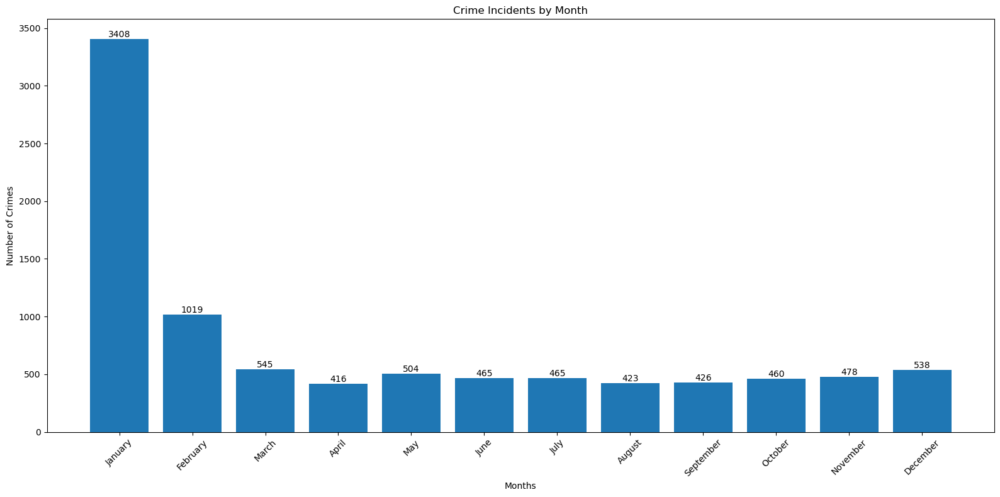

In [2]:
import pandas as pd
import matplotlib.pyplot as plt

# Convert the "Date Occurred" column to datetime format
crime_data_clean["Date Occurred"] = pd.to_datetime(crime_data_clean["Date Occurred"])

# Extract the month from the "Date Occurred" column
crime_data_clean["month"] = crime_data_clean["Date Occurred"].dt.month

# Group the data by month and get the count of crimes for each month
crime_count_by_month = crime_data_clean["month"].value_counts().sort_index()

# Create a list of month names for labeling the x-axis
month_names = [
    "January", "February", "March", "April", "May", "June",
    "July", "August", "September", "October", "November", "December"
]

# Plot the bar graph
plt.figure(figsize=(16, 8))
bars = plt.bar(crime_count_by_month.index, crime_count_by_month.values)
plt.xticks(crime_count_by_month.index, month_names, rotation=45)
plt.xlabel("Months")
plt.ylabel("Number of Crimes")
plt.title("Crime Incidents by Month")

# Add text annotations for each bar
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, str(height),
             ha="center", va="bottom")

plt.tight_layout()
plt.show()

In [6]:
# Calculate the standard deviation of crime incidents by month
crime_std_dev = crime_data_clean.groupby("month")["month"].count().std()

# Print the final result
print("Standard Deviation of Crime Incidents by Month:", crime_std_dev)

Standard Deviation of Crime Incidents by Month: 848.903263040024


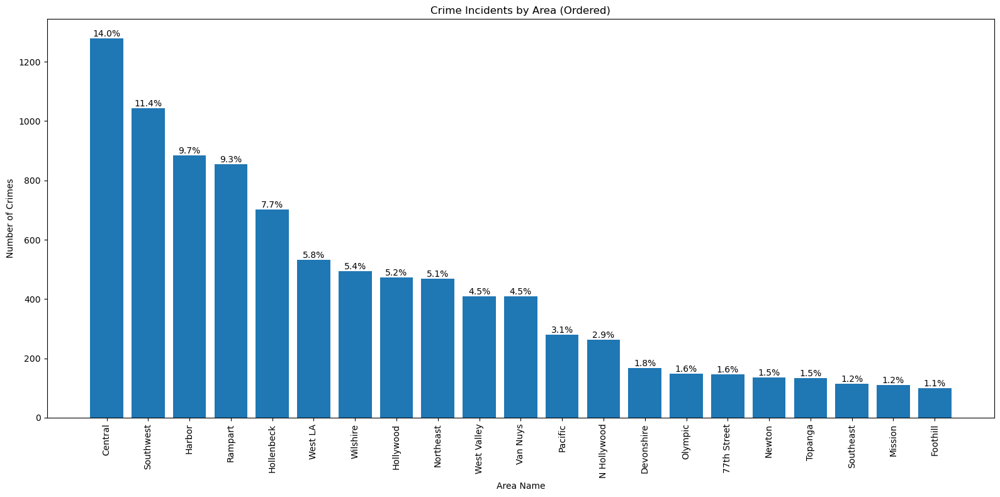

In [3]:
import pandas as pd
import matplotlib.pyplot as plt

# Group the data by "area_name" and get the total count of crimes for each area
crime_count_by_area = crime_data_clean["Area Name"].value_counts()

# Sort the data by area name in descending order of crime count
crime_count_by_area = crime_count_by_area.sort_values(ascending=False)

# Calculate the total number of crimes
total_crimes = crime_count_by_area.sum()

# Calculate the percentage of crimes for each area
crime_percentage = (crime_count_by_area / total_crimes) * 100

# Plot the bar chart
plt.figure(figsize=(16, 8))
bars = plt.bar(crime_count_by_area.index, crime_count_by_area.values)
plt.xlabel("Area Name")
plt.ylabel("Number of Crimes")
plt.title("Crime Incidents by Area (Ordered)")
plt.xticks(rotation=90)  # Rotate x-axis labels for better visibility

# Add percentage labels on top of each bar
for bar, percent in zip(bars, crime_percentage):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f"{percent:.1f}%", ha="center", va="bottom")

plt.tight_layout()
plt.show()

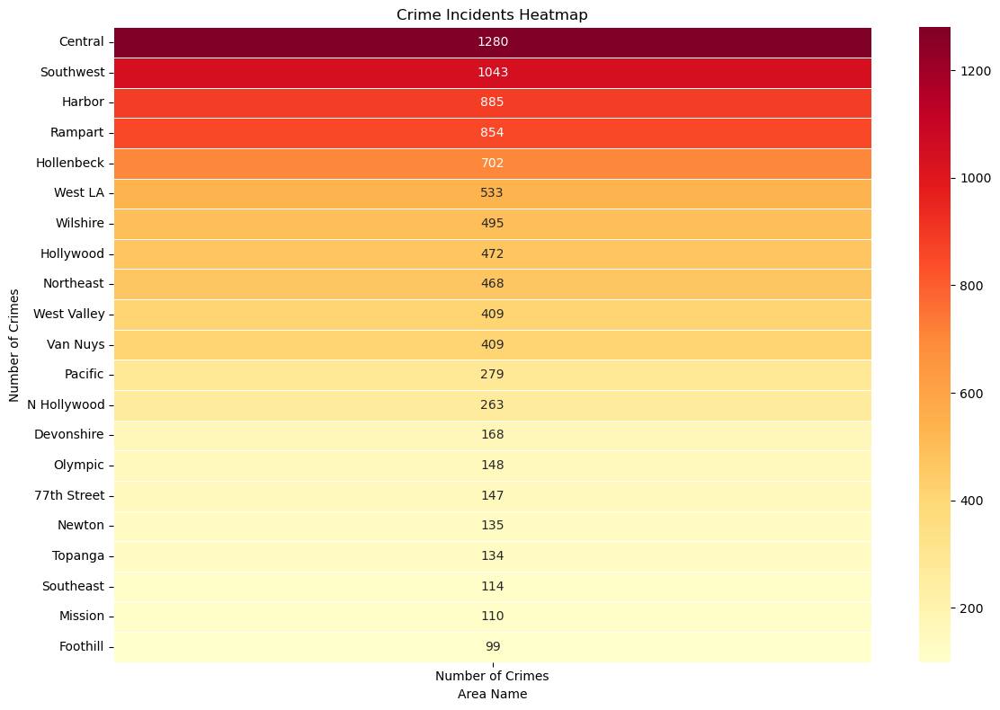

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Group the data by "area_name" and get the total count of crimes for each area
crime_count_by_area = crime_data_clean["Area Name"].value_counts()

# Sort the data by area name in descending order of crime count
crime_count_by_area = crime_count_by_area.sort_values(ascending=False)

# Create a dataframe for heatmap
crime_heatmap_df = pd.DataFrame({"Number of Crimes": crime_count_by_area.values}, index=crime_count_by_area.index)

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(crime_heatmap_df, annot=True, fmt="d", cmap="YlOrRd", linewidths=0.5)
plt.xlabel("Area Name")
plt.ylabel("Number of Crimes")
plt.title("Crime Incidents Heatmap")
plt.tight_layout()
plt.show()

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium

# Group the data by "area_name" and get the total count of crimes for each area
crime_count_by_area = crime_data_clean["Area Name"].value_counts()

# Sort the data by area name in descending order of crime count
crime_count_by_area = crime_count_by_area.sort_values(ascending=False)

# Create a dataframe for heatmap
crime_heatmap_df = pd.DataFrame({"Number of Crimes": crime_count_by_area.values}, index=crime_count_by_area.index)

# Reset index of crime_heatmap_df
crime_heatmap_df = crime_heatmap_df.reset_index()

# Create a folium map centered around Los Angeles
la_map = folium.Map(location=[34.0522, -118.2437], zoom_start=10)

# Iterate through each area and add a marker to the map
for idx, row in crime_data_clean.iterrows():
    area_name = row["Area Name"]
    crimes = crime_heatmap_df.loc[crime_heatmap_df["index"] == area_name, "Number of Crimes"].values[0]
    folium.CircleMarker(
        location=(row["lat"], row["lon"]),
        radius=crimes/5000,
        color='red',
        fill=True,
        fill_color='red',
        fill_opacity=0.6
    ).add_to(la_map)

# Display the map in VS Code
la_map